In [131]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
cf.go_offline()
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

In [242]:
train = pd.read_csv("../input/tabular-playground-series-apr-2021/train.csv")
test = pd.read_csv("../input/tabular-playground-series-apr-2021/test.csv")

train.drop(["Name", "Ticket", "Cabin"], axis=1, inplace=True)
test.drop(["Name", "Ticket", "Cabin"], axis=1, inplace=True)
passid_train = train.pop("PassengerId")
passid_test = test.pop("PassengerId")

joined = pd.concat([train, test], axis=0)

In [243]:
joined.columns = ["survived","class","sex","age","sibsp","parch","fare","embarked"]
train.columns  = ["survived","class","sex","age","sibsp","parch","fare","embarked"]
test.columns   = ["class","sex","age","sibsp","parch","fare","embarked"]

In [244]:
encoder_sex = LabelEncoder()
encoder_sex.fit(joined["sex"])
joined["sex"] = encoder_sex.transform(joined["sex"])
train["sex"] = encoder_sex.transform(train["sex"])
test["sex"] = encoder_sex.transform(test["sex"])

In [245]:
encoder_embarked = LabelEncoder()
encoder_embarked.fit(joined["embarked"].dropna())
joined.loc[joined["embarked"].notna(), "embarked"] = encoder_embarked.transform(joined["embarked"].dropna())
train.loc[train["embarked"].notna(), "embarked"] = encoder_embarked.transform(train["embarked"].dropna())
test.loc[test["embarked"].notna(), "embarked"] = encoder_embarked.transform(test["embarked"].dropna())

In [246]:
train["fare"] = train["fare"].apply(np.log)
test["fare"] = test["fare"].apply(np.log)
joined["fare"] = joined["fare"].apply(np.log)

In [247]:
train["famsize"] = train["sibsp"] + train["parch"] + 1
test["famsize"]  = test["sibsp"] + test["parch"] + 1

In [248]:
unmissed = train.dropna()
unmissed

,survived,class,sex,age,sibsp,parch,fare,embarked,famsize
2,0,3,1,0.33,1,2,4.266756,2,4
3,0,3,1,19.00,0,0,2.568022,2,1
4,1,3,1,25.00,0,0,2.048982,2,1
5,0,2,1,35.00,0,0,1.903599,2,1
6,0,3,1,7.00,0,0,2.279316,2,1
...,...,...,...,...,...,...,...,...,...
99995,1,2,0,62.00,0,0,2.698673,0,1
99996,0,2,1,66.00,0,0,2.411439,2,1
99997,0,3,1,37.00,0,0,2.297573,2,1
99998,0,3,1,51.00,0,1,3.431403,2,2


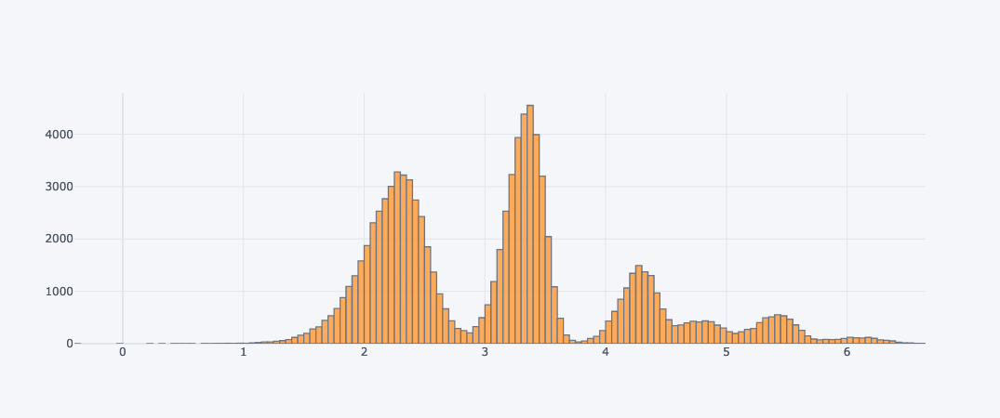

In [98]:
# sns.displot(data=unmissed, x="fare")
unmissed["fare"].iplot(kind="hist")

In [108]:
# Fare buckets
# 1 : < 2.9
# 2 : < 3.8
# 3 : < 4.6
# 4 : >=4.6

def fare_bucket(x):
    if x<2.9:
        return 1
    elif x<3.8:
        return 2
    elif x<4.6:
        return 3
    else:
        return 4

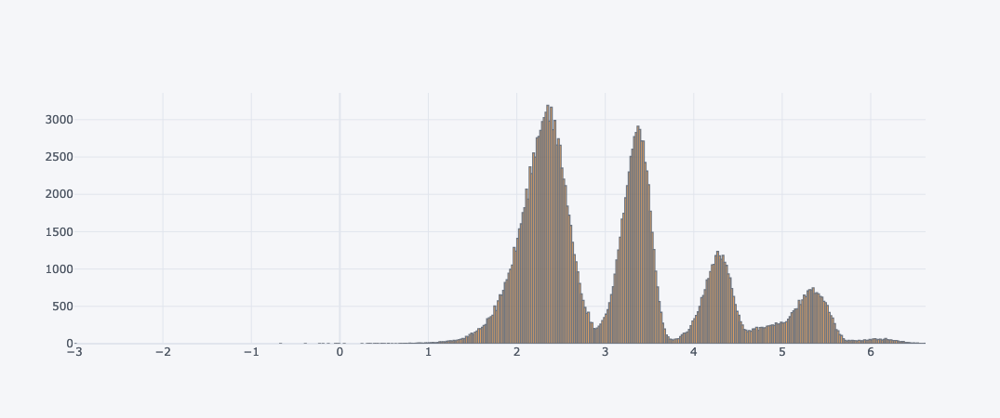

In [105]:
joined["fare"].iplot(kind="hist")

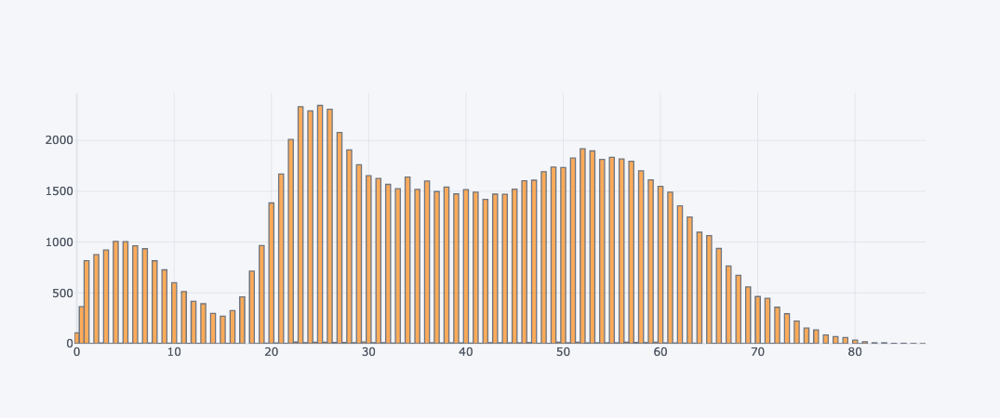

In [100]:
unmissed["age"].iplot(kind="hist")

In [249]:
unmissed["fare_bucket"] = unmissed["fare"].apply(fare_bucket)
unmissed.head()

,survived,class,sex,age,sibsp,parch,fare,embarked,famsize,fare_bucket
2,0,3,1,0.33,1,2,4.266756,2,4,3
3,0,3,1,19.00,0,0,2.568022,2,1,1
4,1,3,1,25.00,0,0,2.048982,2,1,1
5,0,2,1,35.00,0,0,1.903599,2,1,1
6,0,3,1,7.00,0,0,2.279316,2,1,1


In [120]:
xx = unmissed.drop(["survived", "fare_bucket"],axis=1)
yy = unmissed["survived"]
baseline = LogisticRegression(max_iter=1000)
baseline.fit(xx,yy)
print("acc =",baseline.score(xx,yy)*100)
print("roc =", roc_auc_score(yy, baseline.predict_proba(xx)[:,1] )*100)

acc = 76.62147572976788
roc = 82.84591708288667


In [123]:
xx = unmissed.drop(["survived"],axis=1)
yy = unmissed["survived"]
baseline = LogisticRegression(max_iter=1000)
baseline.fit(xx,yy)
print("acc =",baseline.score(xx,yy)*100)
print("roc =", roc_auc_score(yy, baseline.predict_proba(xx)[:,1] )*100)

acc = 76.6463895694058
roc = 82.84421392105716


In [124]:
xx = unmissed.drop(["survived", "fare"],axis=1)
yy = unmissed["survived"]
baseline = LogisticRegression(max_iter=1000)
baseline.fit(xx,yy)
print("acc =",baseline.score(xx,yy)*100)
print("roc =", roc_auc_score(yy, baseline.predict_proba(xx)[:,1] )*100)

acc = 76.61836149981315
roc = 82.79748842638146


In [125]:
xx = unmissed.drop(["survived", "age"],axis=1)
yy = unmissed["survived"]
baseline = LogisticRegression(max_iter=1000)
baseline.fit(xx,yy)
print("acc =",baseline.score(xx,yy)*100)
print("roc =", roc_auc_score(yy, baseline.predict_proba(xx)[:,1] )*100)

acc = 76.64742764605738
roc = 82.8448960572754


In [130]:
xx = unmissed.drop(["survived", "embarked"],axis=1)
yy = unmissed["survived"]
baseline = LogisticRegression(max_iter=1000)
baseline.fit(xx,yy)
print("acc =",baseline.score(xx,yy)*100)
print("roc =", roc_auc_score(yy, baseline.predict_proba(xx)[:,1] )*100)

acc = 75.74326288253125
roc = 81.48398958315407


In [136]:
xx = unmissed.drop(["survived"],axis=1)
yy = unmissed["survived"]

dtree = DecisionTreeClassifier(max_depth=10)
dtree.fit(xx,yy)

print("acc =",dtree.score(xx,yy)*100)
print("roc =", roc_auc_score(yy, dtree.predict_proba(xx)[:,1] )*100)

acc = 78.21699954324627
roc = 85.52512101153951


In [140]:
xx = unmissed.drop(["survived"],axis=1)
yy = unmissed["survived"]
X_train, X_test, y_train, y_test = train_test_split(xx,yy, test_size=0.25, random_state=2021)

rf = RandomForestClassifier(n_estimators=200, max_depth=10, max_features=4)
rf.fit(X_train,y_train)

print("acc =",rf.score(X_train,y_train)*100)
print("acc =",rf.score(X_test,y_test)*100)
print("roc =", roc_auc_score(y_train, rf.predict_proba(X_train)[:,1] )*100)

acc = 99.44635911915736
acc = 72.6487563841714
roc = 99.98104880348272


In [144]:
rf_params = {"n_estimators" : [100, 150, 200, 250, 300, 400, 500],
             "max_depth"    : [5,8,10,15],
             "max_features" : [2, 3, 4, 5],
             "random_state" : [2021]
            }

In [149]:
# rf_grid = GridSearchCV(RandomForestClassifier(), param_grid=rf_params, return_train_score=True, verbose=3)
# rf_grid.fit(X_train, y_train)

Fitting 5 folds for each of 112 candidates, totalling 560 fits
[CV 1/5] END max_depth=5, max_features=2, n_estimators=100, random_state=2021; total time=   2.3s
[CV 2/5] END max_depth=5, max_features=2, n_estimators=100, random_state=2021; total time=   2.2s
[CV 3/5] END max_depth=5, max_features=2, n_estimators=100, random_state=2021; total time=   2.2s
[CV 4/5] END max_depth=5, max_features=2, n_estimators=100, random_state=2021; total time=   2.2s
[CV 5/5] END max_depth=5, max_features=2, n_estimators=100, random_state=2021; total time=   2.2s
[CV 1/5] END max_depth=5, max_features=2, n_estimators=150, random_state=2021; total time=   3.3s
[CV 2/5] END max_depth=5, max_features=2, n_estimators=150, random_state=2021; total time=   3.3s
[CV 3/5] END max_depth=5, max_features=2, n_estimators=150, random_state=2021; total time=   3.3s
[CV 4/5] END max_depth=5, max_features=2, n_estimators=150, random_state=2021; total time=   3.3s
[CV 5/5] END max_depth=5, max_features=2, n_estimators=

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 8, 10, 15],
                         'max_features': [2, 3, 4, 5],
                         'n_estimators': [100, 150, 200, 250, 300, 400, 500],
                         'random_state': [2021]},
             return_train_score=True, verbose=3)

In [152]:
print("best score = ",rf_grid.best_score_*100)
print("best params =", rf_grid.best_params_)

best score =  77.26335966067023
best params = {'max_depth': 8, 'max_features': 2, 'n_estimators': 100, 'random_state': 2021}


In [156]:
print("test acc = ",rf_grid.score(X_test, y_test)*100)
print("train roc =", roc_auc_score(y_train, rf.predict_proba(X_train)[:,1] )*100)
print("test roc =", roc_auc_score(y_test, rf.predict_proba(X_test)[:,1] )*100)

test acc =  76.88410912261762
train roc = 99.98104880348272
test roc = 79.58095633402797


In [158]:
xx = unmissed.drop(["survived"],axis=1)
yy = unmissed["survived"]
rf_full_set = RandomForestClassifier(n_estimators=100, max_depth=8, max_features=2, random_state=2021)
rf_full_set.fit(xx,yy)
print("acc =",rf_full_set.score(xx,yy)*100)
print("roc =", roc_auc_score(yy, rf_full_set.predict_proba(xx)[:,1] )*100)

acc = 77.68965660424367
roc = 84.70463581195594


In [277]:
test["age"] = test["age"].fillna(joined["age"].median())
test["fare"] = test["fare"].fillna(joined["fare"].mean())
test.loc[test["embarked"].isna(), "embarked"] = train["embarked"].mode()
test["fare_bucket"] = test["fare"].apply(fare_bucket)

In [273]:
test.loc[test["embarked"].isna(), "embarked"] = 2

In [193]:
embdata = joined.drop("survived",axis=1).dropna()
# embmodel = LogisticRegression(multi_class="multinomial")
# embmodel.fit(embdata.drop("embarked",axis=1), embdata["embarked"])
# embmodel.score(embdata.drop("embarked",axis=1), embdata["embarked"])*100
knn_emb = KNeighborsClassifier(n_neighbors=50)
knn_emb.fit(embdata.drop("embarked",axis=1), embdata["embarked"].astype("int"))
knn_emb.score(embdata.drop("embarked",axis=1), embdata["embarked"].astype("int"))*100

74.40815181243765

In [222]:
# knn_emb.predict
test.loc[test["embarked"].isna(), "embarked"] = knn_emb.predict( test[test["embarked"].isna()].drop(["embarked","famsize"], axis=1) )

In [278]:
test_predicitons = rf_full_set.predict(test)
result = pd.DataFrame({"PassengerId": passid_test.values, "Survived": test_predicitons})
result

result.to_csv("./subm_apr_24_num_1.csv", index=False)

DO I NEED TO IMPUTE "age","fare","embarked" ?
WE can answer by looking where all "age" is missing, in a graph of other parameters. Similarly for others too.